In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Libraries, data, and functions

In [2]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import random
from sklearn.preprocessing import MinMaxScaler

import pandas as pd
import mpl_toolkits.mplot3d as plt3d
matplotlib.rcParams.update({'font.size': 22})

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense,Reshape, Dropout, Activation, Flatten, Conv1D, MaxPooling1D, UpSampling1D, Input
from tensorflow.keras.models import Model, Sequential
from sklearn.model_selection import train_test_split

In [3]:
def loss_function(y_true, y_pred):

  bs = len(y_true)
  y_true, y_pred = tf.reshape(y_true, (bs,3,3)), tf.reshape(y_pred,(bs,3,3)) 

  perm_rows = tf.linalg.LinearOperatorPermutation([1,2,0])
  true_dist = tf.sqrt(tf.reduce_sum(tf.math.squared_difference( y_true, tf.matmul(perm_rows,y_true) ), axis=-1, keepdims=True))
  pred_dist = tf.sqrt(tf.reduce_sum(tf.math.squared_difference( y_pred, tf.matmul(perm_rows,y_pred) ), axis=-1, keepdims=True))

  return tf.square( tf.reduce_sum( tf.abs( tf.math.subtract(true_dist, pred_dist) ) , axis = 1)  )

In [4]:
#Function which plots the 3D traingle

def Plot_2(v1, v2, v3, vv1, vv2, vv3):
  fig = plt.figure()
  fig.set_size_inches(5,5)
  ax = fig.add_subplot(111, projection='3d')
  
  X = np.array([v1,v2,v3])
  Y = np.array([vv1,vv2,vv3])
  
  l0x, ll0x = np.linspace(v1[0], v2[0], 50), np.linspace(vv1[0], vv2[0], 50)
  l1x, ll1x = np.linspace(v2[0], v3[0], 50), np.linspace(vv2[0], vv3[0], 50)
  l2x, ll2x = np.linspace(v3[0], v1[0], 50), np.linspace(vv3[0], vv1[0], 50)
  l0y, ll0y = np.linspace(v1[1], v2[1], 50), np.linspace(vv1[1], vv2[1], 50)
  l1y, ll1y = np.linspace(v2[1], v3[1], 50), np.linspace(vv2[1], vv3[1], 50)
  l2y, ll2y = np.linspace(v3[1], v1[1], 50), np.linspace(vv3[1], vv1[1], 50)
  l0z, ll0z = np.linspace(v1[2], v2[2], 50), np.linspace(vv1[2], vv2[2], 50)
  l1z, ll1z = np.linspace(v2[2], v3[2], 50), np.linspace(vv2[2], vv3[2], 50)
  l2z, ll2z = np.linspace(v3[2], v1[2], 50), np.linspace(vv3[2], vv1[2], 50)

  #Drawing lines
  ax.scatter(l0x, l0y, l0z, color='red', marker='s', s = 1, alpha = 0.1), ax.scatter(ll0x, ll0y, ll0z, color='black', marker='s', s = 1, alpha = 0.1)
  ax.scatter(l1x, l1y, l1z, color='red', marker='s', s = 1, alpha = 0.1), ax.scatter(ll1x, ll1y, ll1z, color='black', marker='s', s = 1, alpha = 0.1)
  ax.scatter(l2x, l2y, l2z, color='red', marker='s', s = 1, alpha = 0.1), ax.scatter(ll2x, ll2y, ll2z, color='black', marker='s', s = 1, alpha = 0.1)


  #plot the nodes
  for x, y, z in X:
    ax.scatter(x, y, z, color='red', marker='o', s=30)
  for x, y, z in Y:
    ax.scatter(x, y, z, color='black', marker='o', s=30)

  ax.scatter(0, 0, 0, color='blue', marker='s', s = 0.01 )
  ax.scatter(1, 0, 0, color='blue', marker='s', s = 0.01 )
  ax.scatter(0, 1, 0, color='blue', marker='s', s = 0.01 )
  ax.scatter(0, 0, 1, color='blue', marker='s', s = 0.01 )
  ax.scatter(1, 1, 1, color='blue', marker='s', s = 0.01 )

In [5]:
def side_lens(v):
  vx,vy,vz = np.array_split(v , 3)
  return np.array([np.linalg.norm(vx-vy), 
                   np.linalg.norm(vy-vz), 
                   np.linalg.norm(vz-vx)])

This cell is for importing larger datasets from google drive instead of remaking them.

### **LJ-Potential** -   $V_{\mathrm{LJ}}(r)=4\left(\left(\frac{\sigma}{r}\right)^{12}-\left(\frac{\sigma}{r}\right)^{6}\right)$

In [6]:
def LJ(r, sigma):
  return 4*( (sigma/r)**12 - (sigma/r)**6) 

### Loading in models

In [7]:
en_predictor_sym= keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/En_Pred_Symmetric_LD2")
en_predictor_rnd= keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/En_Pred_Random_Data_LD2")
en_predictor_per= keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/En_Pred_No_Permutation_LD2")
en_predictor_sid= keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/En_Pred_Side_2D")

In [8]:
# Actual Model
sym_mod = keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/Symm_AE2"        , compile=False )     # Symmetric permuted data
per_mod = keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/Symm_AE2_No_Perm", compile=False )     # No permutation
rnd_mod = keras.models.load_model("/content/drive/MyDrive/Project/Custom_loss/Symm_AE2_norm"   , compile=False )     # Completely random

sym_mod.compile(loss=loss_function)
per_mod.compile(loss=loss_function)
rnd_mod.compile(loss=loss_function)

In [9]:
input   = sym_mod.get_layer(index = 0)
l1      = sym_mod.get_layer(index = 1)
latent  = sym_mod.get_layer(index = 2)


#Building sym encoder
enc_sym = Sequential()
enc_sym.add(input )
enc_sym.add(l1    )
enc_sym.add(latent)
enc_sym.summary()

input   = per_mod.get_layer(index = 0)
l1      = per_mod.get_layer(index = 1)
latent  = per_mod.get_layer(index = 2)


#Building perm encoder
enc_per = Sequential()
enc_per.add(input )
enc_per.add(l1    )
enc_per.add(latent)
enc_per.summary()

input   = rnd_mod.get_layer(index = 0)
l1      = rnd_mod.get_layer(index = 1)
latent  = rnd_mod.get_layer(index = 2)


#Building rnd encoder
enc_rnd = Sequential()
enc_rnd.add(input )
enc_rnd.add(l1    )
enc_rnd.add(latent)
enc_rnd.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 256)               2560      
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 514       
Total params: 3,074
Trainable params: 3,074
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               2560      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 514       
Total params: 3,074
Trainable params: 3,074
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_2"
________

### Data

In [10]:
df_sym = pd.read_csv('/content/drive/My Drive/Project/Autoencoder triangular molecule/training/Symm_data.csv')
df_rnd = pd.read_csv('/content/drive/My Drive/Project/Autoencoder triangular molecule/training/Symm_data_norm.csv')
df_per = pd.read_csv('/content/drive/My Drive/Project/Autoencoder triangular molecule/training/Symm_data_no_perm.csv')

In [11]:
DATA_SIZE = 200000
r_min     = 0.48   # Need a minimum as in nature the pole at r = 0 is non-phyiscal
sigma     =  .5    # Scaling for LJ

In [12]:
# Euclidean data
x_data_sym = np.array([df_sym['x1'],df_sym['y1'],df_sym['z1'],
                       df_sym['x2'],df_sym['y2'],df_sym['z2'],
                       df_sym['x3'],df_sym['y3'],df_sym['z3'] ]).T
                   
x_data_rnd = np.array([df_rnd['x1'],df_rnd['y1'],df_rnd['z1'],
                       df_rnd['x2'],df_rnd['y2'],df_rnd['z2'],
                       df_rnd['x3'],df_rnd['y3'],df_rnd['z3'] ]).T

x_data_per = np.array([df_per['x1'],df_per['y1'],df_per['z1'],
                       df_per['x2'],df_per['y2'],df_per['z2'],
                       df_per['x3'],df_per['y3'],df_per['z3'] ]).T


# Side len data
x_side_sym  = np.array([df_sym['L1'],
                        df_sym['L2'],
                        df_sym['L3']]).T

x_side_rnd  = np.array([df_rnd['L1'],
                        df_rnd['L2'],
                        df_rnd['L3']]).T

x_side_per  = np.array([df_per['L1'],
                        df_per['L2'],
                        df_per['L3']]).T                       

# Creating an array with the LJ-Energy for each particle
ei_sym = LJ(x_side_sym, sigma)
ei_per = LJ(x_side_per, sigma)
ei_rnd = LJ(x_side_rnd, sigma)

# Summing and multiplying by two to retrieve the molecules tot en
y_data_sym = np.array(2*(np.sum(ei_sym, axis = 1)))
y_data_per = np.array(2*(np.sum(ei_per, axis = 1)))
y_data_rnd = np.array(2*(np.sum(ei_rnd, axis = 1)))

print('Perm:',x_side_per[:3], '\n\n'
      'Sym:', x_side_sym[:3], '\n\n'
      'Rnd:', x_side_rnd[:3], '\n\n')

Perm: [[0.68       0.76448204 0.86659383]
 [0.68       0.62068994 0.85335304]
 [0.68       0.61006631 0.84834228]] 

Sym: [[0.68       0.9803883  0.81502503]
 [0.57015502 0.68       0.55567349]
 [0.55480074 0.68       0.63801778]] 

Rnd: [[0.77637177 0.65225594 0.62416536]
 [0.50502782 0.60138949 0.65661537]
 [0.77824986 1.1738423  0.58082895]] 




In [13]:
#scaler = MinMaxScaler()
#
#x_side_per = scaler.fit_transform(x_side_per)
#x_sym_sid  = scaler.fit_transform(x_side_sym)
#x_side_per = scaler.fit_transform(x_side_rnd)

In [14]:
# Using the encoder to generate latent space points
x_sym_lat = enc_sym.predict(x_data_sym)
x_per_lat = enc_per.predict(x_data_per)
x_rnd_lat = enc_rnd.predict(x_data_rnd)
x_sid     = x_side_sym
x_sid     = np.delete(x_sid,[0],-1)

### Rnd latent space

In [15]:
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=10)

In [16]:
lens = x_side_rnd
lats = x_rnd_lat

tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]

scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) #normalize( tot_lens, np.min(tot_lens), np.max(tot_lens) )

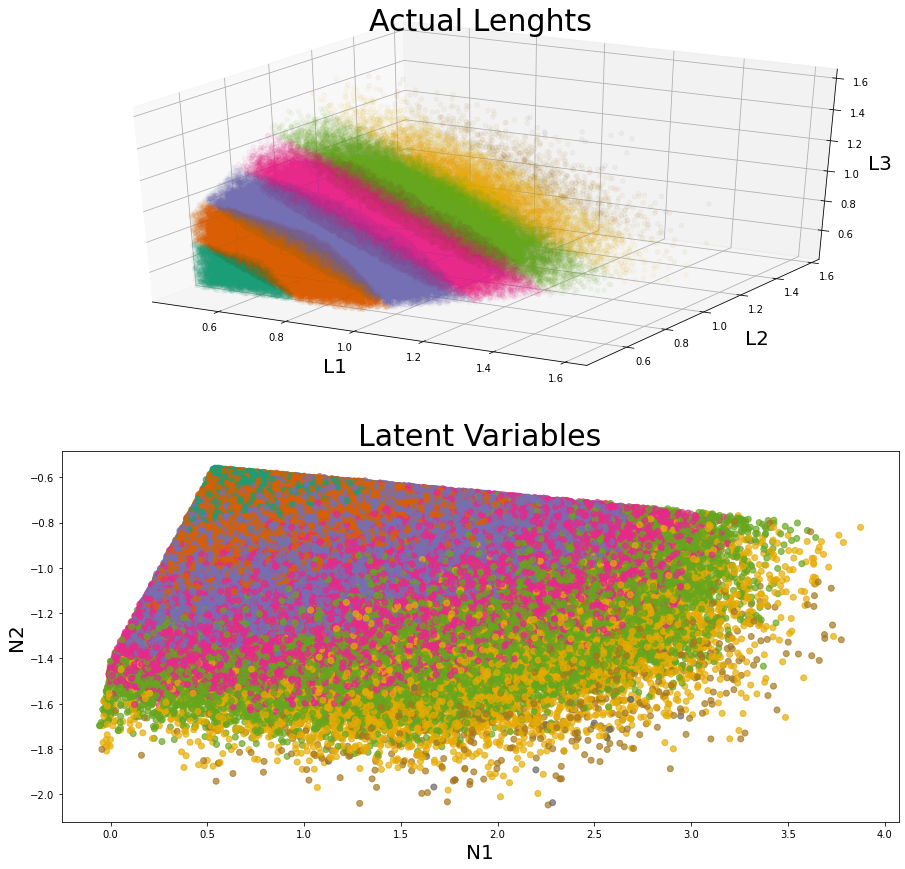

In [17]:
fig = plt.figure( figsize = (15,15) );  

'''
3D Plot
'''

matplotlib.rc('font', size=20)
ax1 = fig.add_subplot(211,projection='3d')
ax1.scatter3D(lens[:,0],lens[:,1],lens[:,2],
              c=color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.05, label = 'Node Value');       
ax1.set_title('Actual Lenghts',fontsize = 30)
ax1.set_xlabel('L1', labelpad=15);ax1.set_ylabel('L2',labelpad=15);ax1.set_zlabel('L3');   
ax1.dist = 9.4

'''
2D Plot
'''
ax2 = fig.add_subplot(212)
ax2.scatter( lats[:,0], lats[:,1], 
                  c = color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.7 , label = 'Actual Lens');
ax2.set_xlabel('N1');ax2.set_ylabel('N2'); 
ax2.set_title('Latent Variables',fontsize = 30)

plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/lat_len_rnd',transparent=True,bbox_inches='tight')
plt.show()

### rnd en

In [18]:
scaler = MinMaxScaler()

x_rnd_lat  = scaler.fit_transform(x_rnd_lat)
Ens      = scaler.fit_transform(y_data_rnd.reshape((DATA_SIZE,1)))

r   = np.sum(x_rnd_lat[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len

#en_predictor_rnd.evaluate(x_rnd_lat, y_rnd)
pred_ens = en_predictor_rnd.predict(x_rnd_lat)

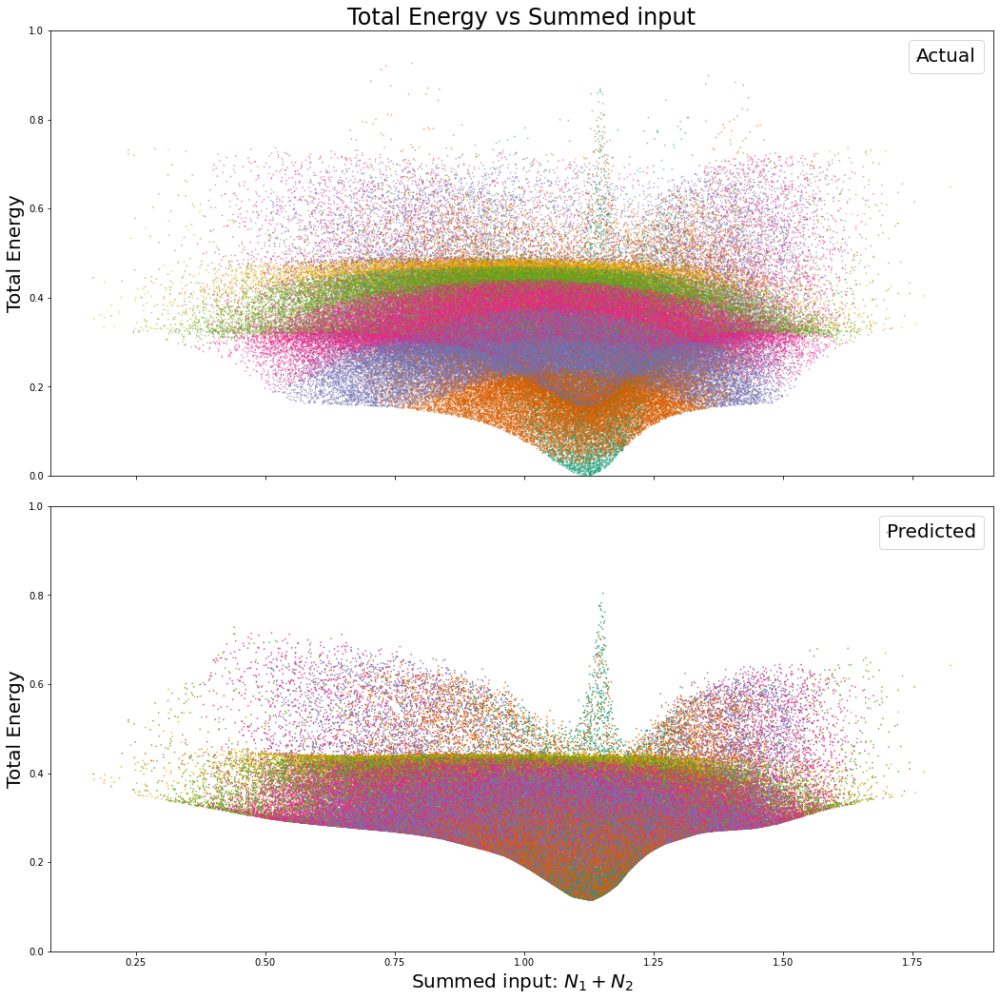

In [19]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed input')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed input: $N_1+N_2$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/rnd_en_lats',transparent=True,bbox_inches='tight')

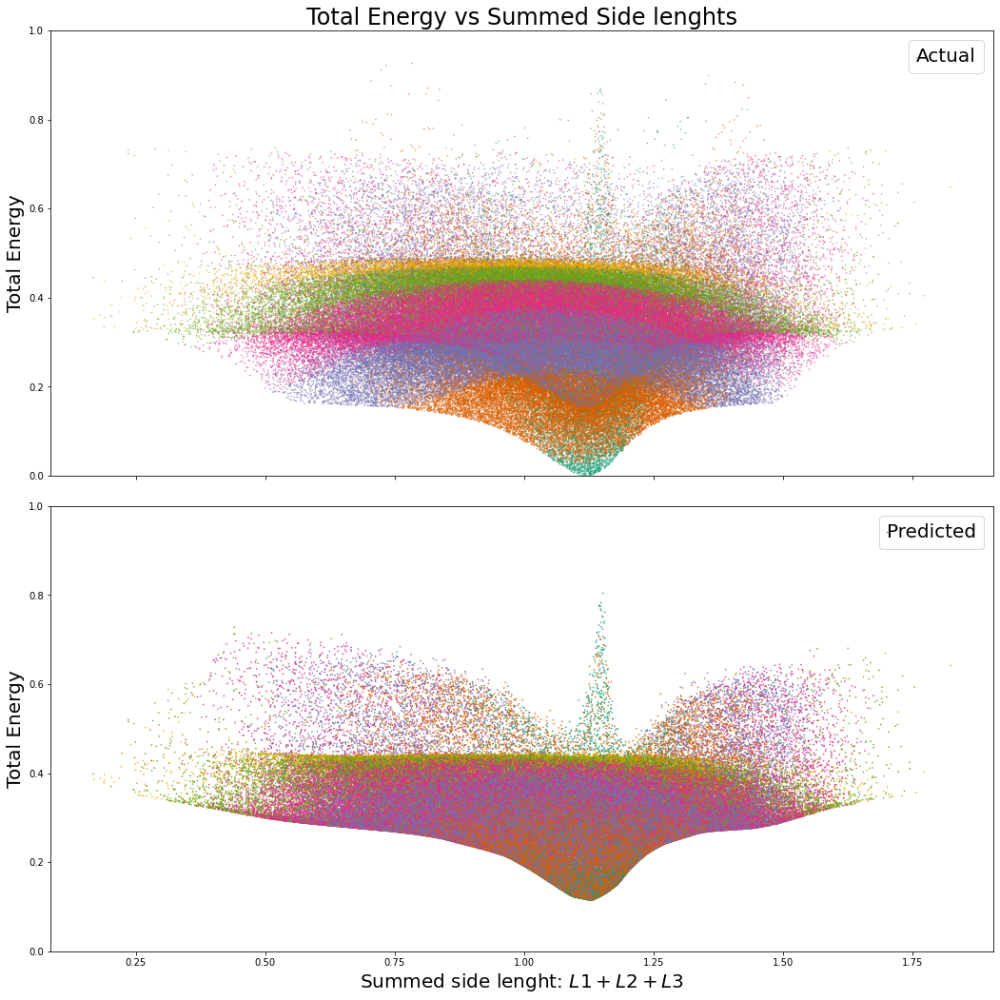

In [21]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed Side lenghts')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed side lenght: $L1+L2+L3$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/rnd_en_lens',transparent=True,bbox_inches='tight')

No handles with labels found to put in legend.


(0.0, 1.0)

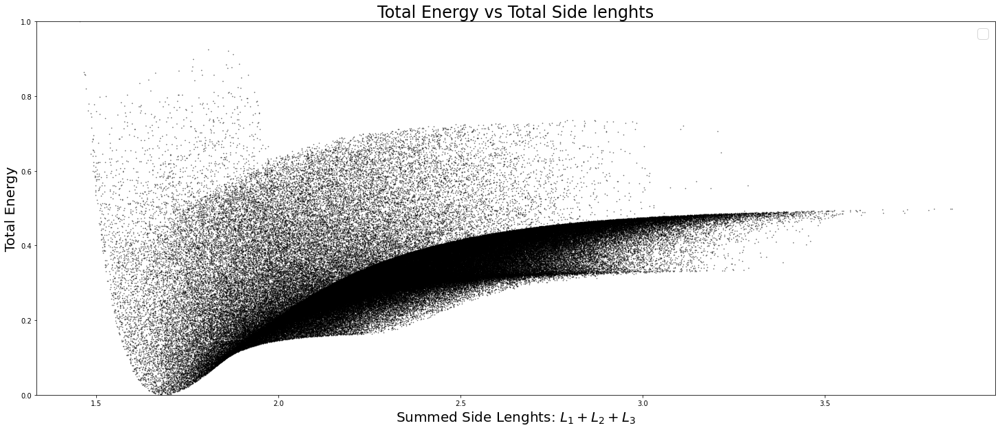

In [22]:
r   = np.sum(x_side_rnd[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len
fig, ax1 = plt.subplots(1,figsize = (25,10))
ax1.set_title('Total Energy vs Total Side lenghts')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c='k', s = .5)
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_xlabel('Summed Side Lenghts: $L_1+L_2+L_3$')

ax1.set_ylim((0,1))

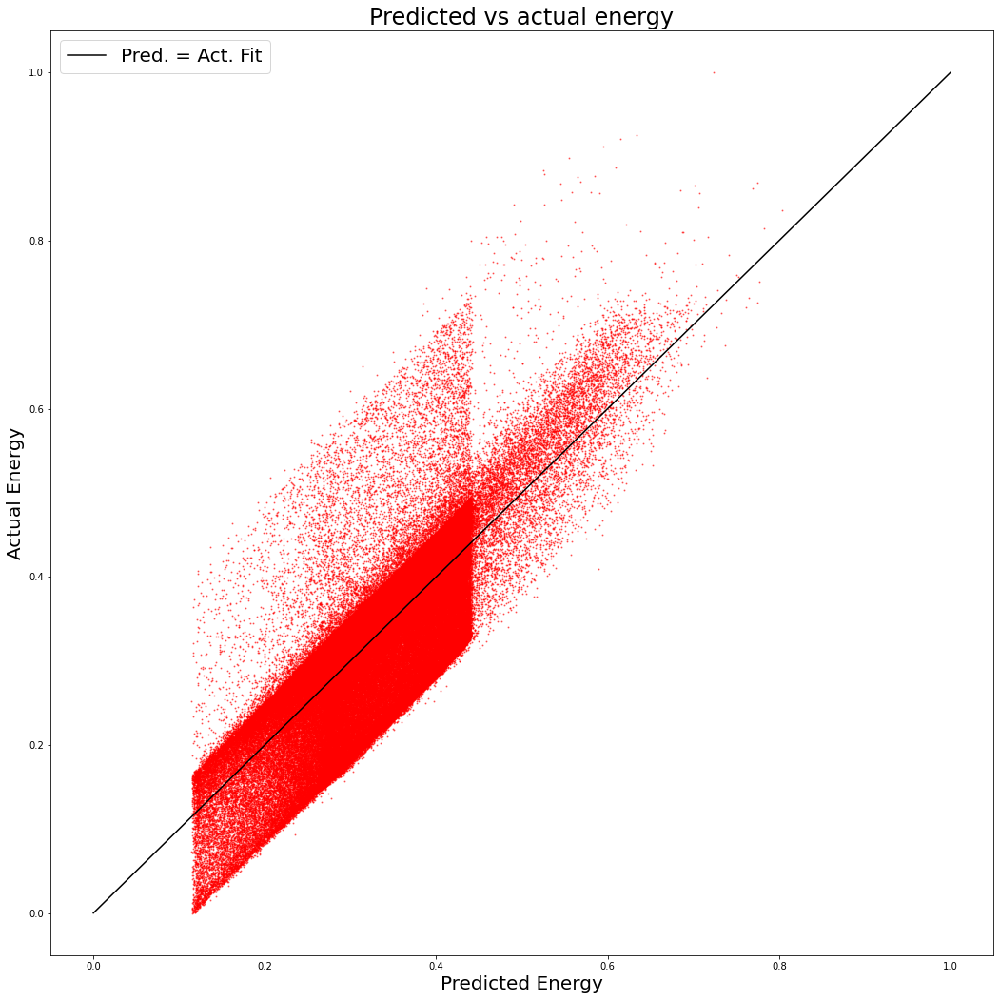

In [23]:
# Plotting Predicted energy vs Actual
plt.figure( figsize=(15,15) )
plt.title( 'Predicted vs actual energy' )
plt.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
plt.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Pred. = Act. Fit')
plt.xlabel('Predicted Energy')
plt.ylabel('Actual Energy')
plt.legend(markerscale=10,scatterpoints=1)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/act_pred_rnd',transparent=True,bbox_inches='tight')
plt.show()

### Per latent space

In [24]:
lens = x_side_per
lats = x_per_lat

tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]

scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) #normalize( tot_lens, np.min(tot_lens), np.max(tot_lens) )

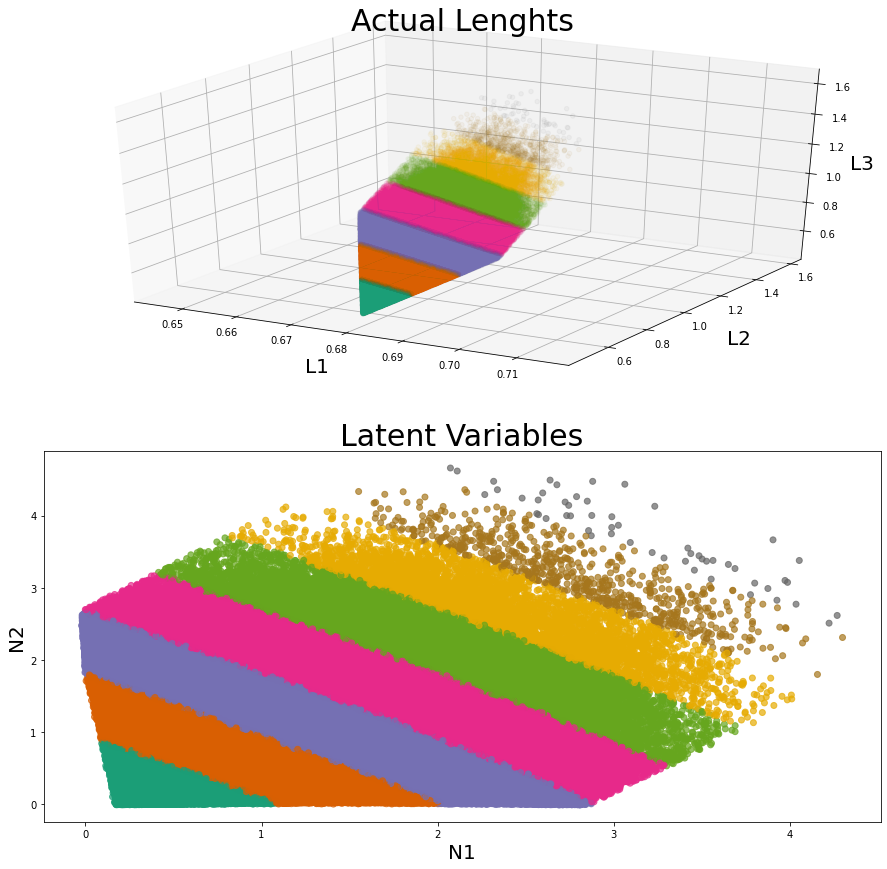

In [25]:
fig = plt.figure( figsize = (15,15) );  

'''
3D Plot
'''

matplotlib.rc('font', size=20)
ax1 = fig.add_subplot(211,projection='3d')
ax1.scatter3D(lens[:,0],lens[:,1],lens[:,2], 
                  zdir = 'z', c=color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.05, label = 'Node Value');       
ax1.set_title('Actual Lenghts',fontsize = 30)
ax1.set_xlabel('L1', labelpad=15);
ax1.set_ylabel('L2', labelpad=15);
ax1.set_zlabel('L3');  
ax1.dist = 9.4

'''
2D Plot
'''
ax2 = fig.add_subplot(212)
ax2.scatter( lats[:,0], lats[:,1], 
                  c = color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.7 , label = 'Actual Lens');

ax2.set_xlabel('N1');ax2.set_ylabel('N2'); 
ax2.set_title('Latent Variables',fontsize = 30)
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/lat_len_per',transparent=True,bbox_inches='tight')
plt.show()

In [26]:
lats  = scaler.fit_transform(lats)
Ens   = scaler.fit_transform(y_data_per.reshape((DATA_SIZE,1)))

r   = np.sum(lats[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len

pred_ens = en_predictor_per.predict(lats)

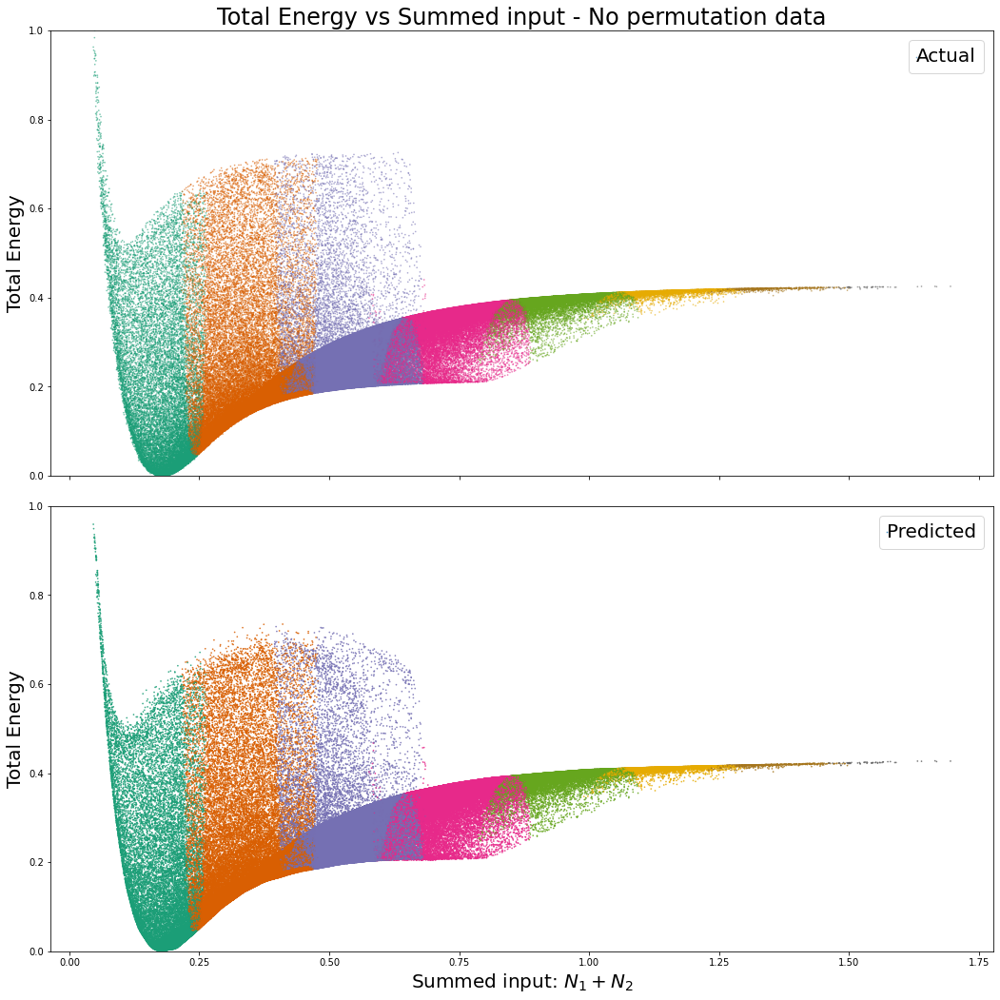

In [27]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed input - No permutation data')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed input: $N_1+N_2$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/tot_en_pred_per',transparent=True,bbox_inches='tight')

In [28]:
r   = np.sum(lens[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len

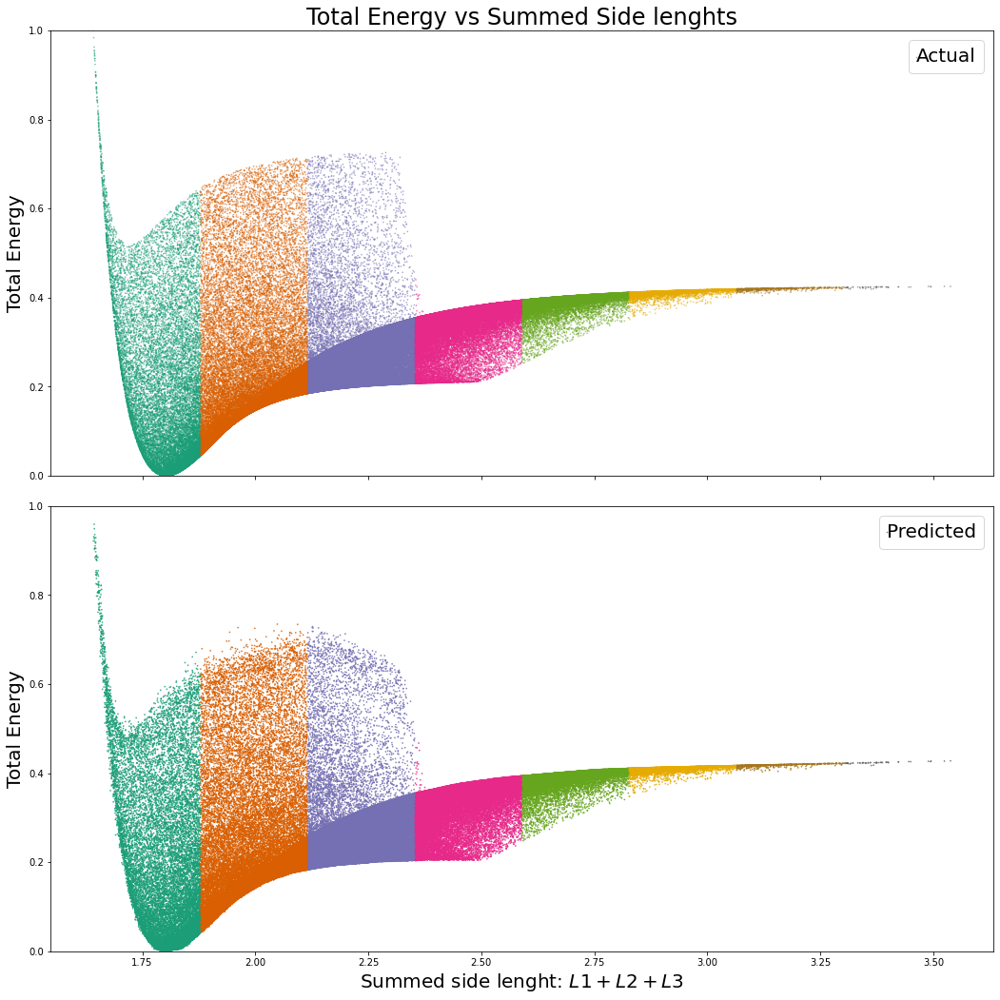

In [29]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed Side lenghts')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed side lenght: $L1+L2+L3$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/per_en_lens',transparent=True,bbox_inches='tight')

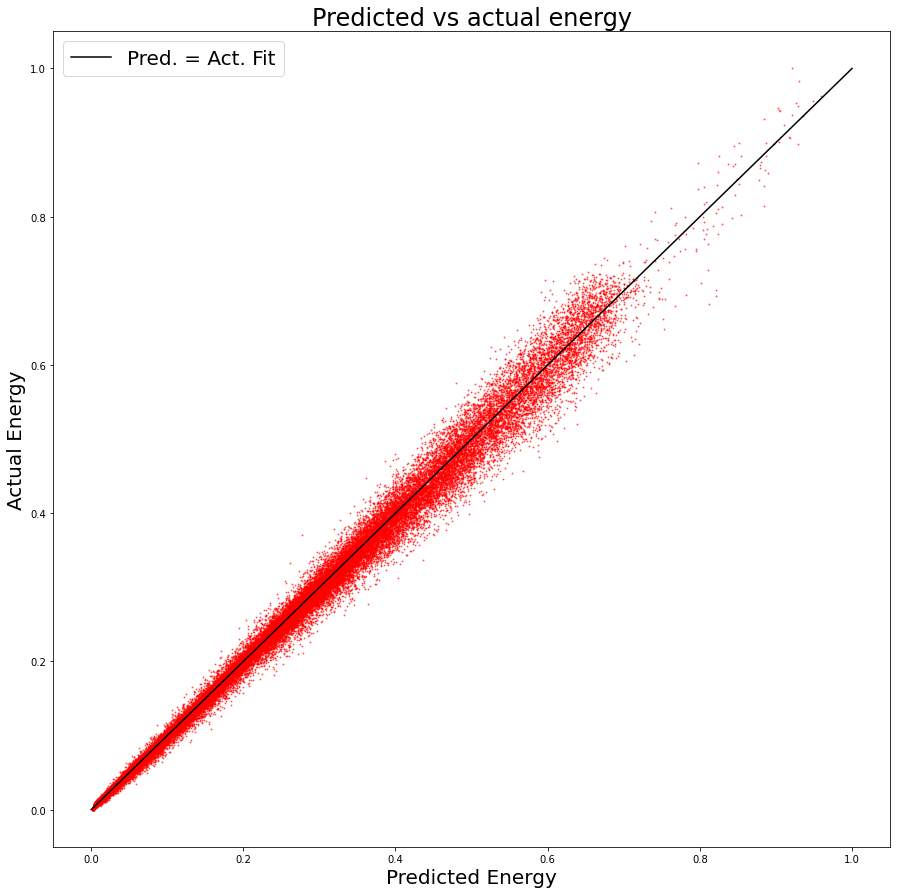

In [30]:
# Plotting Predicted energy vs Actual
plt.figure( figsize=(15,15) )
plt.title( 'Predicted vs actual energy' )
plt.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
plt.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Pred. = Act. Fit')
plt.xlabel('Predicted Energy')
plt.ylabel('Actual Energy')
plt.legend(markerscale=10,scatterpoints=1)
fig.tight_layout()
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/act_pred_per',transparent=True,bbox_inches='tight')
plt.show()

### Sym latent space

In [31]:
lens = x_side_sym
lats = x_sym_lat

tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] + lens[:,1] + lens[:,2]

scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) #normalize( tot_lens, np.min(tot_lens), np.max(tot_lens) )

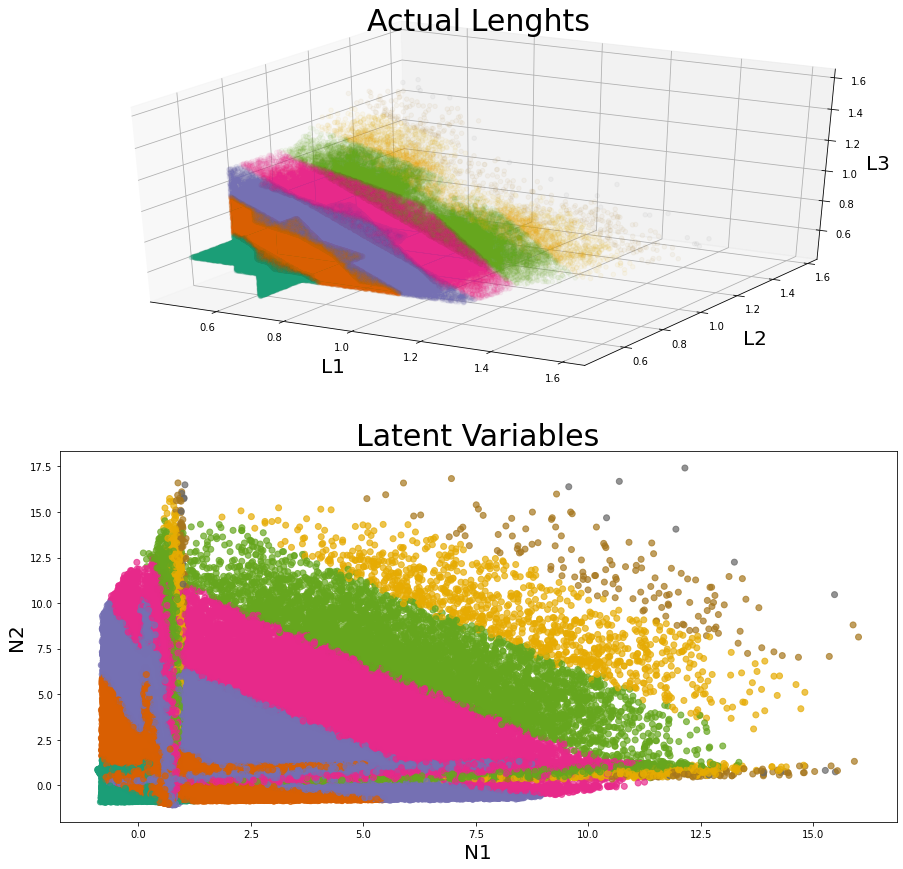

In [32]:
fig = plt.figure( figsize = (15,15) );  

'''
3D Plot
'''

matplotlib.rc('font', size=20)
ax1 = fig.add_subplot(211,projection='3d')
ax1.scatter3D(lens[:,0],lens[:,1],lens[:,2], 
                  zdir = 'z', c=color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.05, label = 'Node Value');       
ax1.set_title('Actual Lenghts',fontsize = 30)
ax1.set_xlabel('L1', labelpad=15);
ax1.set_ylabel('L2',labelpad=15);
ax1.set_zlabel('L3');  
ax1.dist = 9.4

'''
2D Plot
'''
ax2 = fig.add_subplot(212)
ax2.scatter( lats[:,0], lats[:,1], 
                  c = color_map,  cmap=plt.get_cmap('Dark2'),
                  alpha = 0.7 , label = 'Actual Lens');

ax2.set_xlabel('N1');ax2.set_ylabel('N2'); 
ax2.set_title('Latent Variables',fontsize = 30)

ax2.xaxis.set_tick_params(labelsize=10)
ax2.yaxis.set_tick_params(labelsize=10)
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/lat_len_sym',transparent=True,bbox_inches='tight')
plt.show()

In [33]:
lats  = scaler.fit_transform(lats)
Ens   = scaler.fit_transform(y_data_sym.reshape((DATA_SIZE,1)))

r   = np.sum(lats[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len

pred_ens = en_predictor_sym.predict(lats)

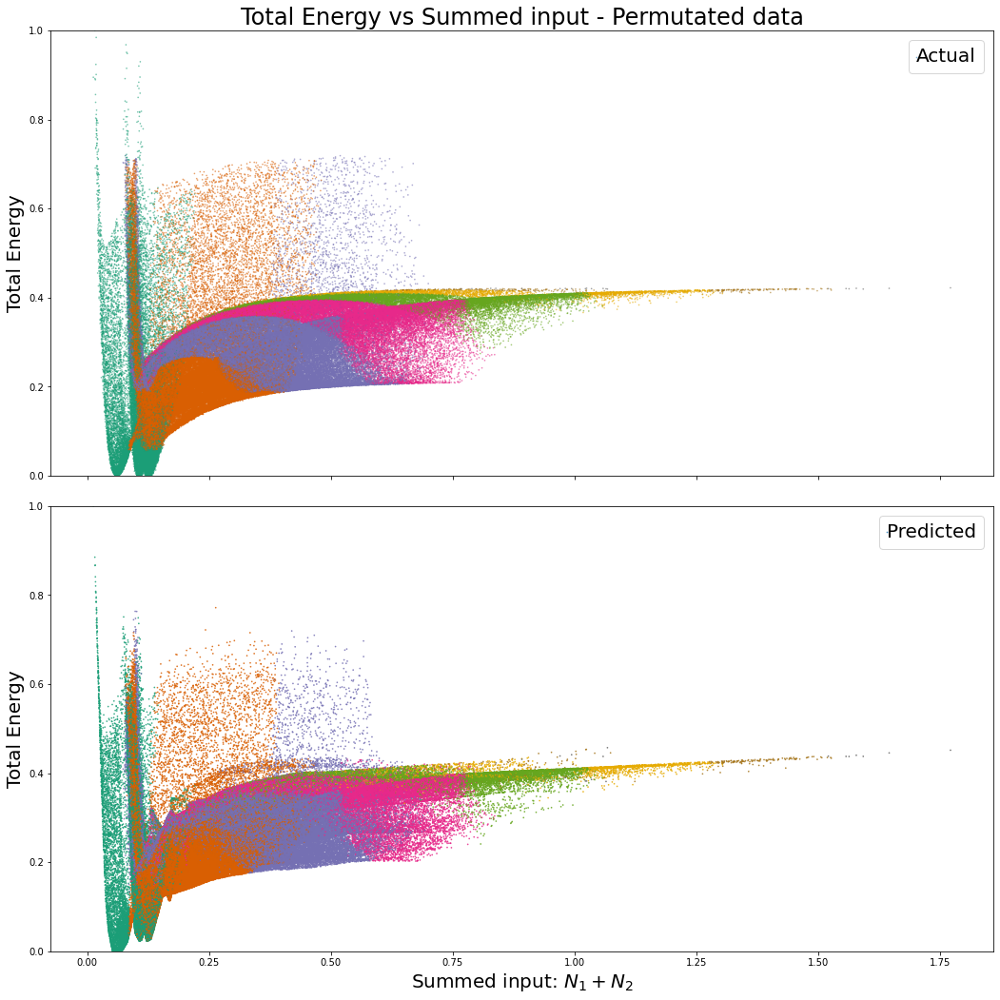

In [34]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed input - Permutated data')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed input: $N_1+N_2$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/sym_en_lats',transparent=True,bbox_inches='tight')

In [35]:
r   = np.sum(lens[:], axis = -1) #= np.sum(x_side_rnd[:], axis = -1) # Tot side len

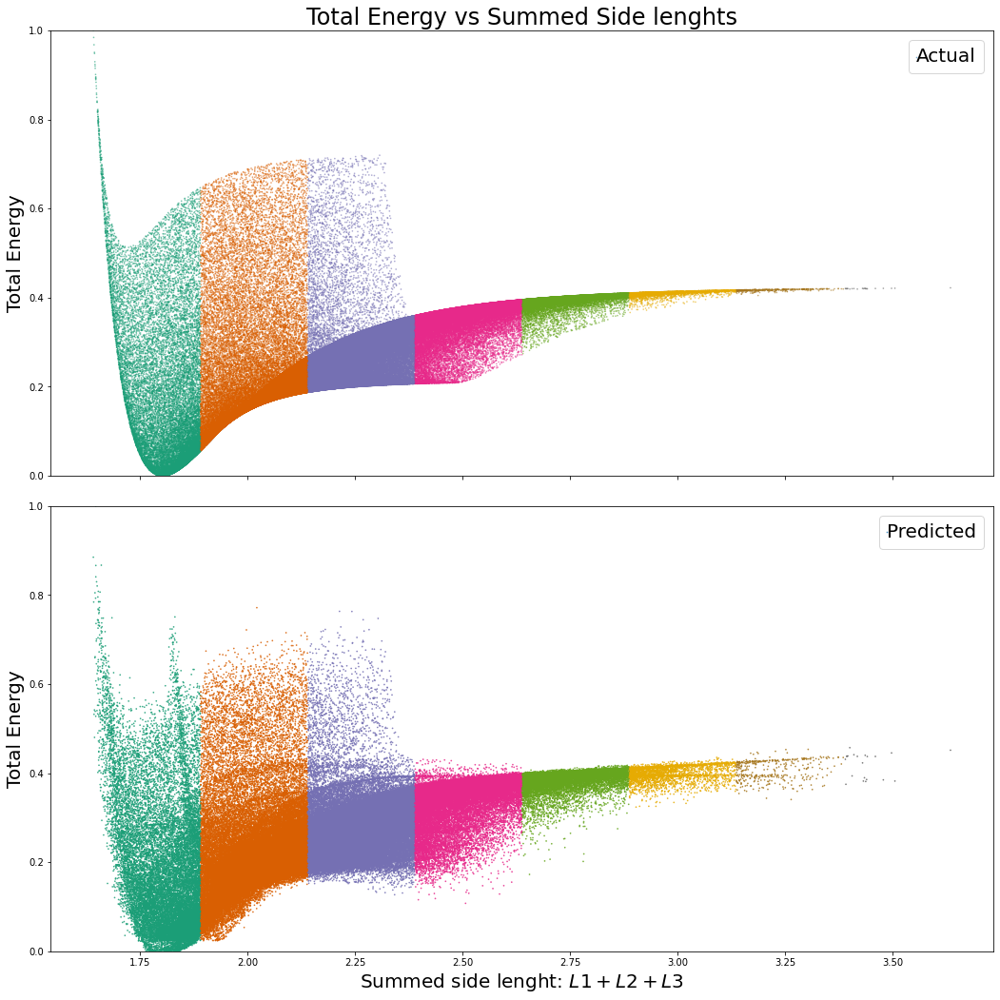

In [36]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))
ax1.set_title('Total Energy vs Summed Side lenghts')

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True)
ax1.set_ylabel('Total Energy')
ax1.set_ylim((0,1))

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True)
ax2.set_xlabel('Summed side lenght: $L1+L2+L3$')
ax2.set_ylabel('Total Energy')
ax2.set_ylim((0,1))
fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/sym_en_lens',transparent=True,bbox_inches='tight')

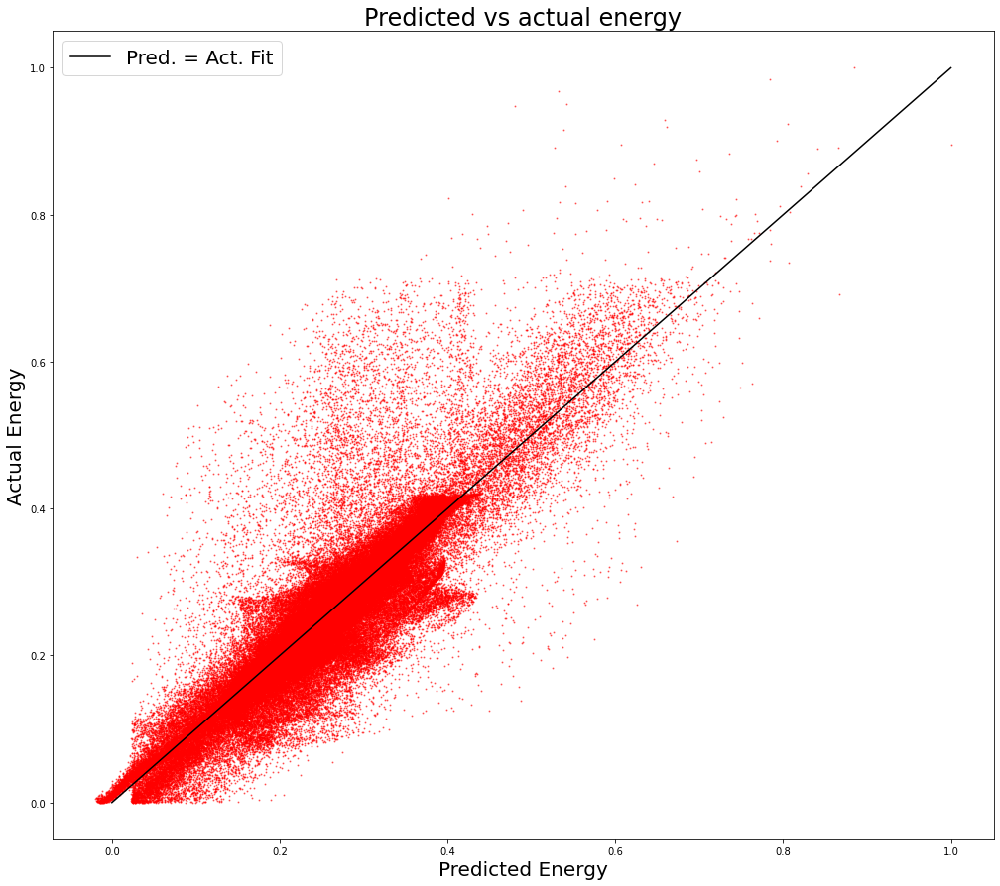

In [37]:
# Plotting Predicted energy vs Actual
plt.figure( figsize=(17,15) )
plt.title( 'Predicted vs actual energy' )
plt.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
plt.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Pred. = Act. Fit')
plt.xlabel('Predicted Energy')
plt.ylabel('Actual Energy')
plt.legend(markerscale=10,scatterpoints=1)
fig.tight_layout()
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/act_pred_sym',transparent=True,bbox_inches='tight')
plt.show()

## Plotting all 

### Lens

In [74]:
size = 40
alph = .5

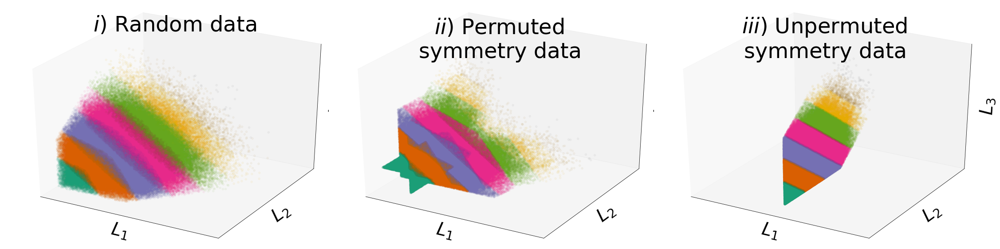

In [109]:
fig = plt.figure( figsize = (30,6.5) );  
matplotlib.rc('font', size=size)

lens = x_side_rnd
lats = x_rnd_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

ax1 = fig.add_subplot(131,projection='3d')
ax1.scatter3D(lens[:,0],lens[:,1],lens[:,2],c=color_map,  cmap=plt.get_cmap('Dark2'),alpha = 0.05, label = 'Node Value');
ax1.dist = 9.4
ax1.set_xlabel('$L_1$');
ax1.set_ylabel('$L_2$');
ax1.set_zlabel('$L_3$'); 

ax1.set_title('$i)$ Random data', pad = -20); 

ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_zticks([])
ax1.grid(False)

lens = x_side_sym
lats = x_sym_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

ax2 = fig.add_subplot(132,projection='3d')
ax2.scatter3D(lens[:,0],lens[:,1],lens[:,2],c=color_map,  cmap=plt.get_cmap('Dark2'),alpha = 0.05, label = 'Node Value');
ax2.dist = 9.4
ax2.set_xlabel('$L_1$');
ax2.set_ylabel('$L_2$');
ax2.set_zlabel('$L_3$'); 
ax2.set_title('$ii)$ Permuted \nsymmetry data', pad = -80); 

ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_zticks([])
ax2.grid(False)

lens = x_side_per
lats = x_per_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

ax3 = fig.add_subplot(133,projection='3d')
ax3.scatter3D(lens[:,0],lens[:,1],lens[:,2],c=color_map,  cmap=plt.get_cmap('Dark2'),alpha = 0.05, label = 'Node Value');
ax3.dist = 9.4
ax3.set_xlabel('$L_1$');
ax3.set_ylabel('$L_2$');
ax3.set_zlabel('$L_3$'); 
ax3.set_title('$iii)$ Unpermuted \nsymmetry data', pad= -80); 

ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_zticks([])
ax3.grid(False)
fig.subplots_adjust(left=-3, right=0, bottom=0, top=1)
fig.tight_layout(pad=-1)

plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/lens',transparent=True,bbox_inches='tight')
plt.show()

### Lats

<Figure size 2160x540 with 0 Axes>

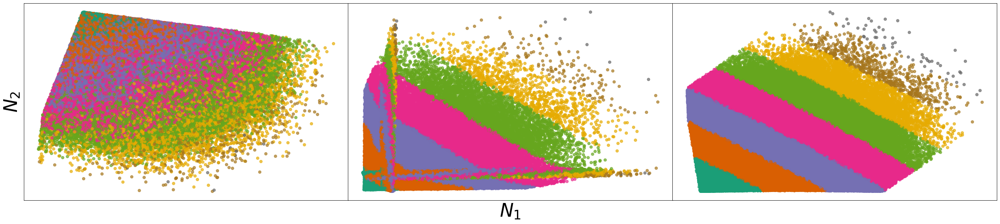

In [105]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,  sharey=True, sharex=True, figsize = (30,6.5))

lens = x_side_rnd
lats = x_rnd_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 
lens= scaler_col.fit_transform(lens)
lats= scaler_col.fit_transform(lats)
ax1.scatter( lats[:,0], lats[:,1], c = color_map,  cmap=plt.get_cmap('Dark2'), alpha = 0.7 , label = 'Actual Lens');
ax2.set_xlabel('$N_1$');ax1.set_ylabel('$N_2$'); 
plt.xticks([])
plt.yticks([])

lens = x_side_sym
lats = x_sym_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 
lens= scaler_col.fit_transform(lens)
lats= scaler_col.fit_transform(lats)

ax2.scatter( lats[:,0], lats[:,1], c = color_map,  cmap=plt.get_cmap('Dark2'), alpha = 0.7 , label = 'Actual Lens');
plt.xticks([])
plt.yticks([])

lens = x_side_per
lats = x_per_lat
tot_nodes =  lats[:,0] + lats[:,1]
tot_lens  =  lens[:,0] +  lens[:,1] + lens[:,2]
color_map = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 
lens= scaler_col.fit_transform(lens)
lats= scaler_col.fit_transform(lats)


ax3.scatter( lats[:,0], lats[:,1], c = color_map,  cmap=plt.get_cmap('Dark2'), alpha = 0.7 , label = 'Actual Lens');
plt.xticks([])
plt.yticks([])
plt.tight_layout(pad=-.1)

plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/lats',transparent=True,bbox_inches='tight')

### Act en

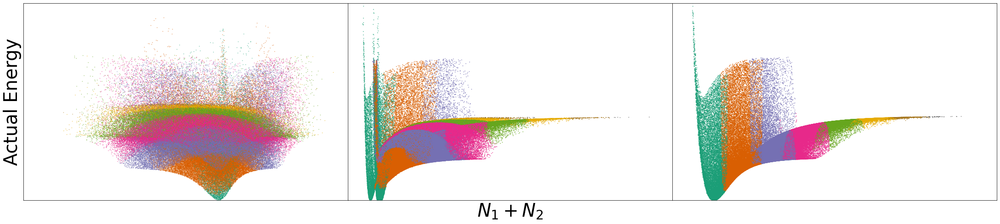

In [111]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,  sharey=True, sharex=True, figsize = (30,6.5))


lens       = x_side_rnd
lats       = x_rnd_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_rnd.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_rnd.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.set_ylabel('Actual Energy')
ax1.set_ylim((0,1))
plt.xticks([])
plt.yticks([])

lens       = x_side_sym
lats       = x_sym_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_sym.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_sym.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], Ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.set_xlabel('$N_1+N_2$')
ax2.set_ylim((0,1))
plt.xticks([])
plt.yticks([])

lens       = x_side_per
lats       = x_per_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_per.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_per.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax3.scatter(r[:], Ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax3.set_ylim((0,1))
plt.xticks([])
plt.yticks([])
plt.tight_layout(pad=-.1)
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/act_ens',transparent=True,bbox_inches='tight')

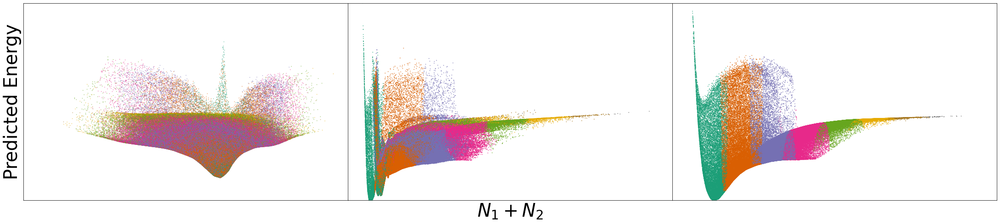

In [110]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,  sharey=True, sharex=True, figsize = (30,6.5))


lens       = x_side_rnd
lats       = x_rnd_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_rnd.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_rnd.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, pred_ens, alpha = 0.5,c = color_map,cmap=plt.get_cmap('Dark2'), s = .5, label = 'Actual')
ax1.set_ylabel('Predicted Energy')
ax1.set_ylim((0,1))
plt.xticks([])
plt.yticks([])

lens       = x_side_sym
lats       = x_sym_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_sym.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_sym.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax2.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax2.set_xlabel('$N_1+N_2$')
ax2.set_ylim((0,1))
plt.xticks([])
plt.yticks([])

lens       = x_side_per
lats       = x_per_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_per.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_per.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax3.scatter(r[:], pred_ens.flatten()[:], alpha = 0.8,c = color_map,  cmap=plt.get_cmap('Dark2'), s = .5, label = 'Predicted')
ax3.set_ylim((0,1))
plt.xticks([])
plt.yticks([])
plt.tight_layout(pad=-.1)
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/pred_ens',transparent=True,bbox_inches='tight')

### Act vs Pred

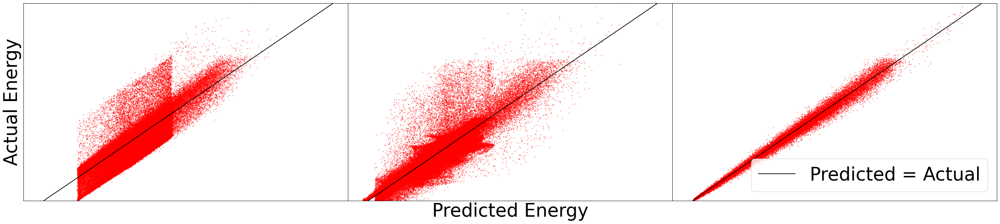

In [108]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,  sharey=True, sharex=True, figsize = (30,6.5))


lens       = x_side_rnd
lats       = x_rnd_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_rnd.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_rnd.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax1.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
ax1.set_ylabel('Actual Energy')
ax1.set_ylim((0,1))
ax1.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Predicted = Actual')

plt.xticks([])
plt.yticks([])

lens       = x_side_sym
lats       = x_sym_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_sym.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_sym.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax2.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
ax2.set_xlabel('$N_1+N_2$')
ax2.set_ylim((0,1))
ax2.set_xlabel('Predicted Energy')
ax2.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Predicted = Actual')

plt.xticks([])
plt.yticks([])

lens       = x_side_per
lats       = x_per_lat
lats       = scaler.fit_transform(lats)
Ens        = scaler.fit_transform(y_data_per.reshape((DATA_SIZE,1)))
r          = np.sum(lats[:], axis = -1) 
pred_ens   = en_predictor_per.predict(lats)

tot_lens   =  lens[:,0] +  lens[:,1] + lens[:,2]
scaler_col = MinMaxScaler()
color_map  = scaler_col.fit_transform(tot_lens.reshape( (DATA_SIZE,1) )) 

# Plotting Predicted energy vs tot side lin
ax3.scatter(pred_ens, Ens, alpha = .5, s = 1, c = 'r')
ax3.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Predicted = Actual')
ax3.set_ylim((0,1))
plt.xticks([])
plt.yticks([])
plt.tight_layout(pad=-.1)
plt.legend(loc='lower right')
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/act_preds',transparent=True,bbox_inches='tight')

## Evaluation


### Triangle side lenghts, with one constant side, and one of the sides randomly removed

In [ ]:
# Eval on test set
scaler = MinMaxScaler()
y_sym =   scaler.fit_transform(y_data_sym.reshape((DATA_SIZE,1)))
r   = np.sum(x_side_sym[:], axis = -1) # Tot side len
pred_ens = en_predictor_sid.predict(x_sid)
Ens = y_sym

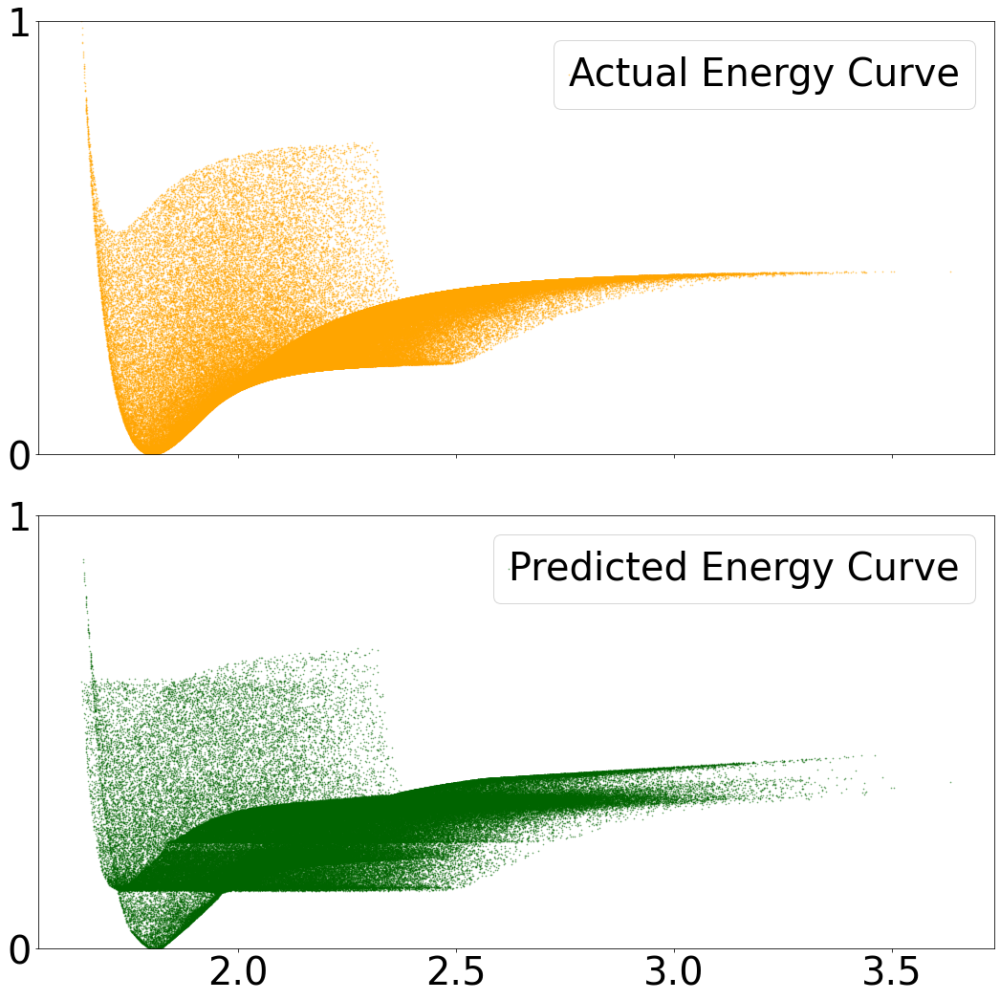

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize = (15,15))

size = 40

# Plotting Predicted energy vs tot side lin
ax1.scatter(r, Ens,      alpha = 0.5, s = .5 ,c='orange',label = 'Actual Energy Curve')
ax1.legend(handlelength=0, handletextpad=0, fancybox=True, fontsize = size)
ax1.set_ylim((0,1))
ax1.set_yticks([0,1])
ax1.tick_params(axis='both', labelsize= size)


# Plotting Predicted energy vs tot side lin
ax2.scatter(r, pred_ens.flatten(), alpha = 0.5,c='darkgreen', s = .5, label = 'Predicted Energy Curve')
ax2.legend(handlelength=0, handletextpad=0, fancybox=True, fontsize = size)
ax2.set_ylim((0,1))
ax2.set_yticks([0,1])
ax2.tick_params(axis='both', labelsize= size)



fig.tight_layout()
fig.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/sid_en_lens',transparent=True,bbox_inches='tight')

In [ ]:
index_array_con = np.where(np.round(x_sid,2) == 0.68 )

In [ ]:
ind_with_con = index_array_con[0] #  one side is constant in this set of triangles
ind_all_rndm = np.delete( np.arange(DATA_SIZE), index_array_con[0]) # both sides are random in this set of triangles


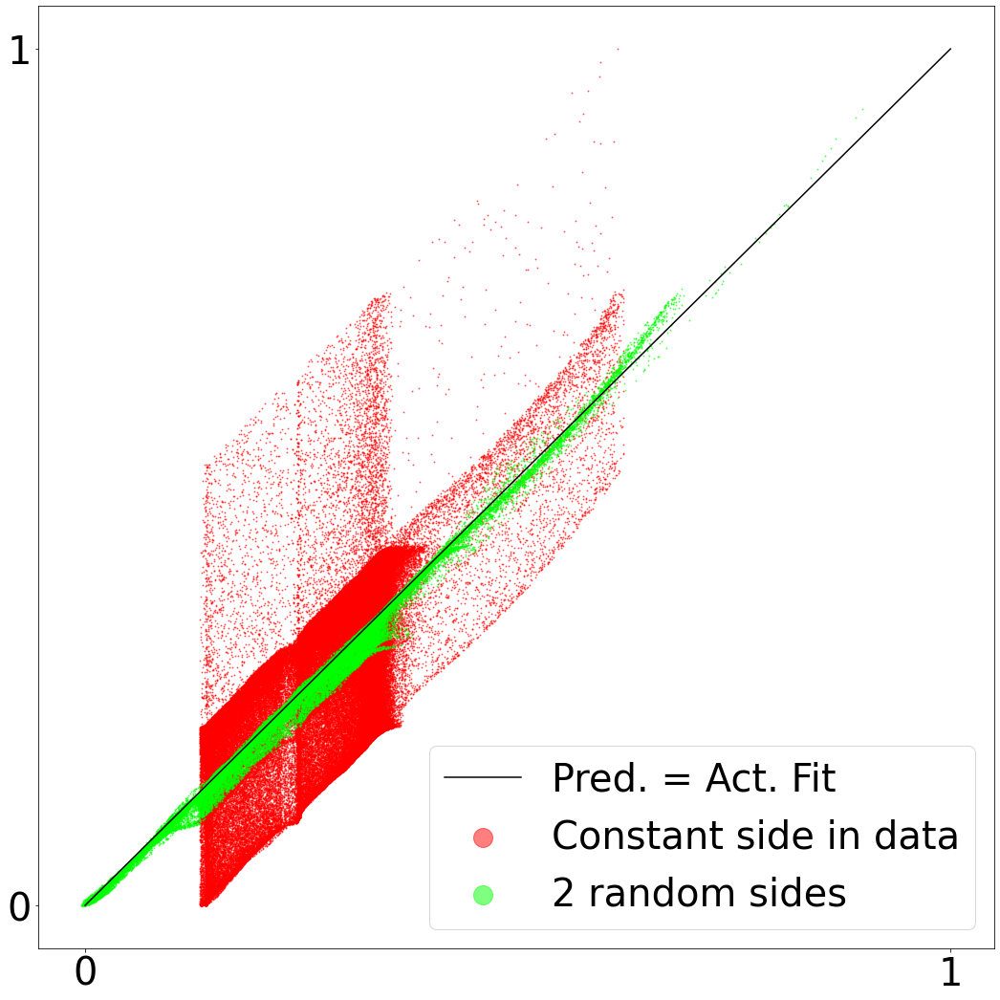

In [ ]:
 # Plotting Predicted energy vs Actual
plt.figure( figsize=(15,15) )
plt.yticks([0,1])
plt.xticks([0,1])

plt.tick_params(axis='both', labelsize= size)
plt.scatter(pred_ens[ind_with_con], 
                 Ens[ind_with_con], 
            alpha = .5, s = 1, c = 'red', label = 'Constant side in data')

plt.scatter(pred_ens[ind_all_rndm], 
                 Ens[ind_all_rndm], 
            alpha = .5, s = 1, c = 'lime', label = '2 random sides')

plt.plot( np.linspace(np.min(Ens),np.max(Ens)),np.linspace(np.min(Ens),np.max(Ens)), c = 'k', label = 'Pred. = Act. Fit')

plt.legend(markerscale=20,scatterpoints=1,fontsize = size)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/sid_pred_act',transparent=True,bbox_inches='tight')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def func(x, a, b):
    return a/x**12+b/x**6

popt, pcov = curve_fit(func, r[ind_with_con], Ens[ind_with_con])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  


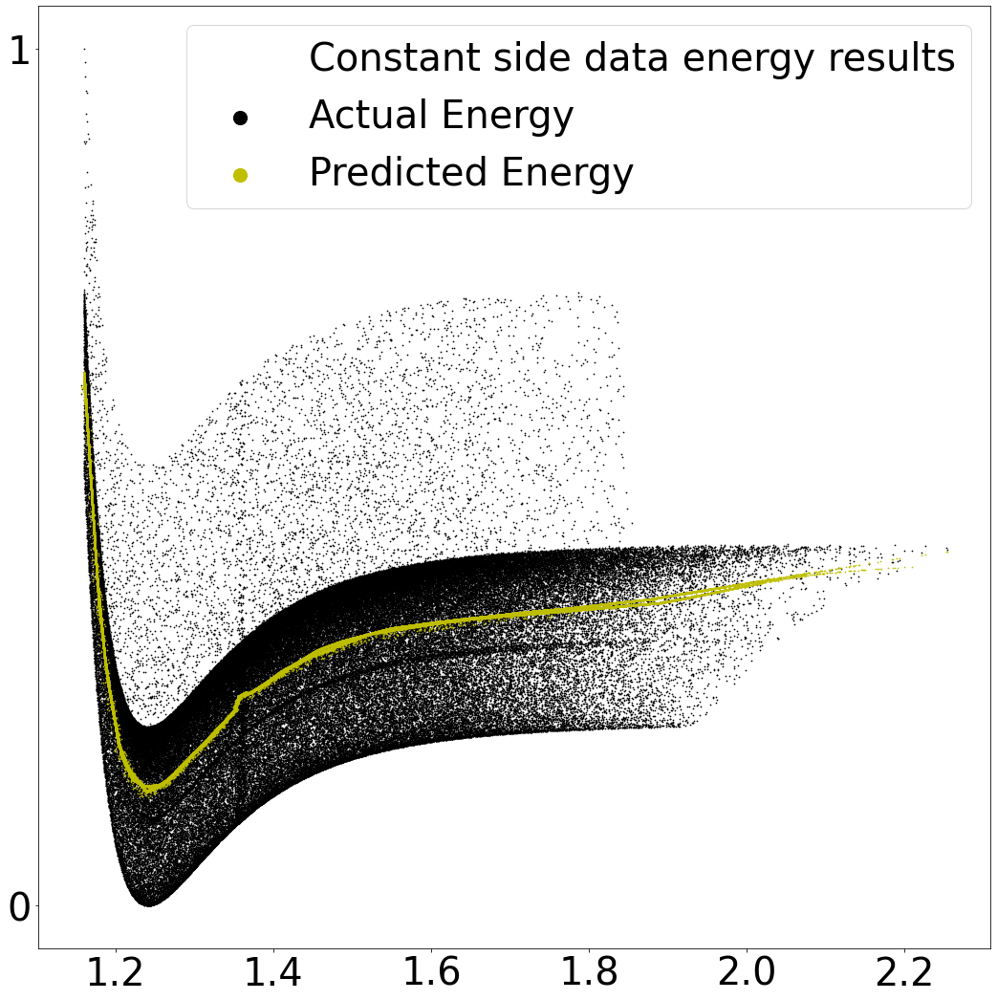

In [ ]:
 # Plotting Predicted energy vs tot side lin
r   = np.sum(x_sid[:], axis = -1) # Tot side len



plt.figure( figsize=(15,15) )
plt.yticks([0,1])
plt.tick_params(axis='both', labelsize= size)
plt.plot([], [], ' ', label='Constant side data energy results')
plt.scatter(r[ind_with_con], Ens[ind_with_con].flatten(),      alpha = 1, s = .5 ,c='k', label = 'Actual Energy')
plt.scatter(r[ind_with_con], pred_ens.flatten()[ind_with_con], alpha = 1,c='y', s = .5, label = 'Predicted Energy')

plt.legend(markerscale=20,scatterpoints=1, fontsize = size)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Symmester 2/Final year project/Writeup/Diagrams/LJ Sym/En_pred_act',transparent=True,bbox_inches='tight')

plt.show()

energies are not evenly distributed about the constant side lenght

previously was usng an x- axis involving the 3-DOF of the system, now using the correct 2-DOF of the two latent dimensions we can see that the system misses an arch of the energy